In [1]:
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler
import torch

In [2]:
import PIL
import requests
import torch
from io import BytesIO

from diffusers import StableDiffusionInpaintPipeline

In [3]:
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16, revision="fp16")

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [11]:
prompt = "MSU students graduating from Deep Learning course, sketch, 4k, high quality colorful image"
images4 = pipe(prompt, num_inference_steps=50, num_images_per_prompt=4).images
# image.save("RL.png")

  0%|          | 0/50 [00:00<?, ?it/s]

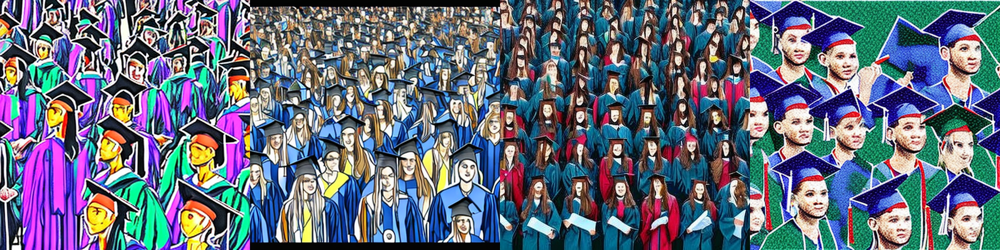

In [12]:
image_grid(images4, 1, 4)

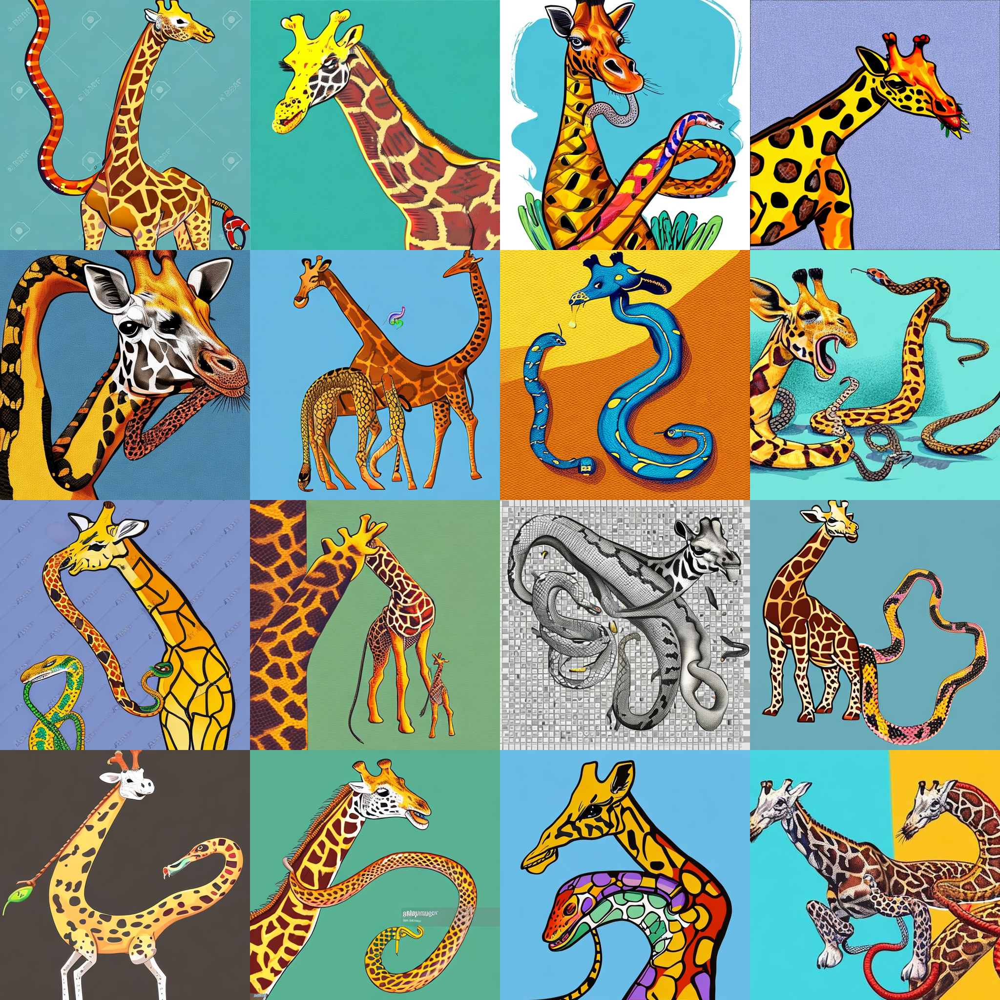

In [41]:
image_grid(images4, 4, 4)